# Hierachical Multivariate Time Series User Classification
##### Using "gaze-path" and pupil dilation data; 33% of the total collected.

#### DEPENDENCIES AND METHODS

In [ ]:
!pip install --quiet pytorch-lightning
!pip install --quiet seaborn

In [3]:
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import json
import plotly.graph_objects as go
import pandas as pd
import torch
import pytorch_lightning as pl
import seaborn as sns
import random
import os

from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from tqdm import tqdm
from IPython.display import HTML
from sklearn.preprocessing import LabelEncoder
from os import cpu_count, environ

import torch.autograd as autograd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn.modules import dropout

from multiprocessing import cpu_count
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torchmetrics.functional import accuracy
from sklearn.metrics import classification_report, confusion_matrix


float_formatter = "{:.8f}".format
np.set_printoptions(formatter={'float_kind':float_formatter})


def print_yellow(text): print("\033[93m {}\033[00m".format(text))


def print_bold(text): print(f"\033[1m {text} \033[0m")


def read_json(path):
  with open(path, 'r') as file_in:
     return json.load(file_in)


def str2listf(l):
    l = l.replace("[", "")
    l = l.replace("]", "")
    l = l.replace("\n", "")
    l = l.split(', ')
    l = [float(i) for i in l]
    return l


def max_listoflists_lenght(l, verbose=False):
  """l is a list of lists"""
  max_lenght = 0
  for i in l:
    if max_lenght < len(i):
      max_lenght = len(i)
  if verbose:
    print("min_lenght: ", min_listoflists_lenght(l))
    print("max_lenght: ", max_lenght)
  return max_lenght


def min_listoflists_lenght(l):
  """l is a list of lists"""
  min_lenght = 999999
  for i in l:
    if min_lenght > len(i):
      min_lenght = len(i)
  return min_lenght


def normalize(l, verbose=False):
  l = (l - np.mean(l)) / np.std(l)
  l = [i.tolist() for i in l]
  if verbose:
    print("max: ", max(l))
    print("mean: ", np.mean(l))
    print("std: ", np.std(l))
  return l


def normalize_lenghts(l, verbose=False, max_lenght=0):
  """l is a list of lists"""
  if max_lenght==0:
    max_lenght = max_listoflists_lenght(l, verbose)
  print("max_lenght: ", max_lenght)
  new_l = [np.interp(np.linspace(0, 1, max_lenght).astype('float'), np.linspace(0, 1, len(l_i)).astype('float'), l_i) for l_i in l]
  if verbose:
    min_listoflists_lenght(l)
  return new_l


def normalize_single_lenght(l, max_lenght=0):
  """l is a list"""
  if max_lenght==0:
    max_lenght = max([len(i) for i in l])
  print("max_lenght: ", max_lenght)
  new_l = np.interp(np.linspace(0, 1, max_lenght).astype('float'), np.linspace(0, 1, len(l)).astype('float'), l)
  return new_l


def add_pattern_name_to_ts(distance_ts, pupil_ts):
  new_pupil_ts = []
  for distance, pupil in zip(distance_ts, pupil_ts):
    pattern_name, _ = distance
    new_pupil_ts.append([pattern_name, pupil])
  return new_pupil_ts


def get_distance_in_dataframe(df, user_name):
  is_user = df['participant_name'] == user_name
  df = df[is_user]
  distance_collection = []
  
  for ix, sample in df.iterrows():
    # print(sample)
    try:
      distance_collection.append([sample['pattern_name'], sample['ts_distance'].tolist()])
    except AttributeError:
      distance_collection.append([sample['pattern_name'], sample['ts_distance']])
  return distance_collection


def get_pupil_in_dataframe(df, user_name):
  is_user = df['participant_name'] == user_name
  df = df[is_user]
  pupil_collection = []

  for ix, sample in df.iterrows():
    try:
      pupil_collection.append([sample['pattern_name'], sample['ts_pupil'].tolist()])
    except AttributeError:
      pupil_collection.append([sample['pattern_name'], sample['ts_pupil']])
  return pupil_collection 
  

def plot_collection(plot_only_this:str, distances_collection,
                    number_of_desired_plots=0):
  
  """this method takes the distances_collection for one user and a specific 
      pattern plot_only_this and add traces in the same graph until the 
      number_of_desired_plots is reached; if 0 then plot all"""

      # todo: there is a lot of redundancy, you could clear a lot of lines

  fig = go.Figure()
  plots_count = 0
  print("total number of graphs: ", len(distances_collection))

  for (pattern_name, d) in distances_collection:
    if pattern_name == plot_only_this:
      if plots_count ==0:
        fig.add_trace(go.Line(y=d))
        fig.update_layout(title=plot_only_this)
      else:
        fig.add_trace(go.Line(y=d))
      plots_count += 1
      fig.update_layout(width=1200, height=800)
      if number_of_desired_plots:
        if plots_count == number_of_desired_plots:
          break

  print("plots: ", plots_count)
  return fig 


def plot_user_compare(plot_only_this:str, distances_collection, labels,
                    number_of_desired_plots=0):
  
  """this method takes the distances_collection for one user and a specific 
      pattern plot_only_this and add traces in the same graph until the 
      number_of_desired_plots is reached; if 0 then plot all"""

      # todo: there is a lot of redundancy, you could clear a lot of lines

  fig = go.Figure()
  plots_count = 0
  print("total number of graphs: ", len(distances_collection))

  for (pattern_name, d), name in zip(distances_collection, labels):
    if pattern_name == plot_only_this:
      if plots_count ==0:
        fig.add_trace(go.Line(y=d, name=name))
        fig.update_layout(title=plot_only_this)
      else:
        fig.add_trace(go.Line(y=d, name=name))
      plots_count += 1
      fig.update_layout(width=1200, height=800)
      if number_of_desired_plots:
        if plots_count == number_of_desired_plots:
          break

  print("plots: ", plots_count)
  return fig 


def plot_experiment(name:str, l, normal=False, normal_only=False, stretched=False, max_lenght=0, verbose=False):
  if verbose:
    print("raw: ")
    print("max: ", max(l))
    print("mean: ", np.mean(l))
    print("std: ", np.std(l), end="\n\n")
    
  fig = go.Figure()
  fig.update_layout(title=name)
  fig.update_layout(width=1200, height=800)
  if not normal_only:
    fig.add_trace(go.Line(name="raw", y=l))

  if normal:
    l_normal = normalize(l, verbose=verbose)
    fig.add_trace(go.Line(name="nomalized_value", y=l_normal))

  if stretched:
    if max_lenght!=0:
      l_normal = normalize_single_lenght(l, max_lenght=max_lenght)
    else:
      l_normal = normalize_single_lenght(l)
    fig.add_trace(go.Line(name="nomalized_lenght", y=l_normal))
      
  return fig


def show_confusion_matrix(confusion_matrix):
  hmap = sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues")
  hmap.yaxis.set_ticklabels(hmap.yaxis.get_ticklabels(), rotation=0, ha='right')
  hmap.xaxis.set_ticklabels(hmap.xaxis.get_ticklabels(), rotation=30, ha='right')
  plt.ylabel('True User')
  plt.xlabel('Predicted User')

#### REPRODUCIBILITY

In [5]:
# Seeds
pl.seed_everything(42)
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Force deterministic behaviour
torch.backends.cudnn.benchmark = False  # causes cuDNN to deterministically select an algorithm, possibly at the cost of reduced performance.
torch.use_deterministic_algorithms(True)
os.environ['CUBLAS_WORKSPACE_CONFIG'] = ":16:8" # ":4096:8" increase library footprint in GPU memory by approximately 24MiB or ":16:8" (may limit overall performance)

# additionally the DataLoader need to use generator and seed_workers fn

# force deterministic behaviour in LSTMs: https://pytorch.org/docs/stable/generated/torch.nn.LSTM.html#torch.nn.LSTM 
# torch.use_deterministic_algorithms(): https://pytorch.org/docs/stable/notes/randomness.html
# DataLoader: use worker_init_fn() and generator to preserve reproducibility

INFO:pytorch_lightning.utilities.seed:Global seed set to 42


#### DATA

In [6]:
PARTICIPANTS = ["Anoth", "Arif", "Ashok", "Gowthom", "Josephin", "Raghu", "Sebastian"]
binary = False

In [7]:
# read dataframe
df_concat = pd.read_csv('./data_ready.csv')
df_concat

,Unnamed: 0,participant_name,pattern_name,ts_distance,ts_pupil,x_coord,y_coord,series_original_lenght
0,0,Anoth,pattern3,"[0.028, 0.028, 0.028, 0.028, 0.028, 0.028, 0.0...","[3.554, 3.554, 3.554, 3.5516, 3.5475, 3.5435, ...","[0.278, 0.278, 0.278, 0.278, 0.278, 0.278, 0.2...","[0.136, 0.136, 0.136, 0.136, 0.136, 0.136, 0.1...",67
1,1,Anoth,pattern6,"[0.012, 0.0111, 0.0103, 0.0094, 0.0085, 0.0074...","[3.382, 3.3816, 3.3811, 3.3826, 3.3847, 3.3873...","[0.277, 0.277, 0.277, 0.277, 0.277, 0.2776, 0....","[0.138, 0.1389, 0.1398, 0.1406, 0.1415, 0.1426...",71
2,2,Anoth,pattern1,"[0.031, 0.0303, 0.0296, 0.0289, 0.0279, 0.0268...","[2.991, 2.9937, 2.9965, 2.9987, 2.9952, 2.9918...","[0.278, 0.2783, 0.2787, 0.279, 0.2794, 0.2797,...","[0.119, 0.1197, 0.1204, 0.1211, 0.1221, 0.1232...",56
3,3,Anoth,pattern3,"[0.025, 0.0254, 0.0258, 0.0258, 0.0254, 0.025,...","[3.175, 3.1762, 3.1775, 3.1768, 3.1747, 3.1724...","[0.275, 0.2754, 0.2758, 0.2758, 0.2754, 0.275,...","[0.129, 0.129, 0.129, 0.1288, 0.1283, 0.128, 0...",67
4,4,Anoth,pattern4,"[0.005, 0.0053, 0.0057, 0.006, 0.007, 0.008, 0...","[3.386, 3.387, 3.388, 3.389, 3.3906, 3.3923, 3...","[0.29, 0.2887, 0.2873, 0.286, 0.2857, 0.2853, ...","[0.145, 0.1447, 0.1443, 0.144, 0.143, 0.142, 0...",54
...,...,...,...,...,...,...,...,...
619,625,Sebastian,pattern5,"[0.018, 0.0175, 0.0171, 0.0166, 0.0161, 0.0168...","[3.022, 3.021, 3.0201, 3.0204, 3.0209, 3.0202,...","[0.26, 0.2605, 0.261, 0.261, 0.261, 0.2618, 0....","[0.133, 0.1344, 0.1358, 0.1364, 0.1369, 0.1374...",77
620,626,Sebastian,pattern1,"[0.007, 0.0073, 0.0077, 0.008, 0.0076, 0.0073,...","[2.976, 2.9791, 2.9822, 2.9852, 2.9876, 2.99, ...","[0.262, 0.2617, 0.2613, 0.261, 0.2614, 0.2617,...","[0.143, 0.1427, 0.1423, 0.142, 0.1424, 0.1427,...",56
621,627,Sebastian,pattern6,"[0.005, 0.005, 0.005, 0.0045, 0.0037, 0.0031, ...","[3.13, 3.1333, 3.1366, 3.1394, 3.1419, 3.1439,...","[0.265, 0.2658, 0.2666, 0.267, 0.267, 0.2669, ...","[0.145, 0.145, 0.145, 0.1455, 0.1463, 0.1469, ...",67
622,628,Sebastian,pattern3,"[0.018, 0.0175, 0.017, 0.0165, 0.016, 0.018, 0...","[3.09, 3.0905, 3.091, 3.0895, 3.088, 3.0885, 3...","[0.268, 0.2675, 0.267, 0.2665, 0.266, 0.268, 0...","[0.144, 0.1445, 0.145, 0.144, 0.143, 0.143, 0....",81


In [8]:
# change datatypes

# del unnamed and make it the index
df_concat.index = df_concat['Unnamed: 0'].tolist()
del df_concat['Unnamed: 0']

# cast values from string to float
df_concat.ts_distance = df_concat.ts_distance.apply(str2listf)
df_concat.ts_pupil = df_concat.ts_pupil.apply(str2listf)
df_concat.x_coord = df_concat.x_coord.apply(str2listf)
df_concat.y_coord = df_concat.y_coord.apply(str2listf)
df_concat['series_original_lenght'] = df_concat['series_original_lenght'].apply(lambda i: int(i))
df_concat

,participant_name,pattern_name,ts_distance,ts_pupil,x_coord,y_coord,series_original_lenght
0,Anoth,pattern3,"[0.028, 0.028, 0.028, 0.028, 0.028, 0.028, 0.0...","[3.554, 3.554, 3.554, 3.5516, 3.5475, 3.5435, ...","[0.278, 0.278, 0.278, 0.278, 0.278, 0.278, 0.2...","[0.136, 0.136, 0.136, 0.136, 0.136, 0.136, 0.1...",67
1,Anoth,pattern6,"[0.012, 0.0111, 0.0103, 0.0094, 0.0085, 0.0074...","[3.382, 3.3816, 3.3811, 3.3826, 3.3847, 3.3873...","[0.277, 0.277, 0.277, 0.277, 0.277, 0.2776, 0....","[0.138, 0.1389, 0.1398, 0.1406, 0.1415, 0.1426...",71
2,Anoth,pattern1,"[0.031, 0.0303, 0.0296, 0.0289, 0.0279, 0.0268...","[2.991, 2.9937, 2.9965, 2.9987, 2.9952, 2.9918...","[0.278, 0.2783, 0.2787, 0.279, 0.2794, 0.2797,...","[0.119, 0.1197, 0.1204, 0.1211, 0.1221, 0.1232...",56
3,Anoth,pattern3,"[0.025, 0.0254, 0.0258, 0.0258, 0.0254, 0.025,...","[3.175, 3.1762, 3.1775, 3.1768, 3.1747, 3.1724...","[0.275, 0.2754, 0.2758, 0.2758, 0.2754, 0.275,...","[0.129, 0.129, 0.129, 0.1288, 0.1283, 0.128, 0...",67
4,Anoth,pattern4,"[0.005, 0.0053, 0.0057, 0.006, 0.007, 0.008, 0...","[3.386, 3.387, 3.388, 3.389, 3.3906, 3.3923, 3...","[0.29, 0.2887, 0.2873, 0.286, 0.2857, 0.2853, ...","[0.145, 0.1447, 0.1443, 0.144, 0.143, 0.142, 0...",54
...,...,...,...,...,...,...,...
625,Sebastian,pattern5,"[0.018, 0.0175, 0.0171, 0.0166, 0.0161, 0.0168...","[3.022, 3.021, 3.0201, 3.0204, 3.0209, 3.0202,...","[0.26, 0.2605, 0.261, 0.261, 0.261, 0.2618, 0....","[0.133, 0.1344, 0.1358, 0.1364, 0.1369, 0.1374...",77
626,Sebastian,pattern1,"[0.007, 0.0073, 0.0077, 0.008, 0.0076, 0.0073,...","[2.976, 2.9791, 2.9822, 2.9852, 2.9876, 2.99, ...","[0.262, 0.2617, 0.2613, 0.261, 0.2614, 0.2617,...","[0.143, 0.1427, 0.1423, 0.142, 0.1424, 0.1427,...",56
627,Sebastian,pattern6,"[0.005, 0.005, 0.005, 0.0045, 0.0037, 0.0031, ...","[3.13, 3.1333, 3.1366, 3.1394, 3.1419, 3.1439,...","[0.265, 0.2658, 0.2666, 0.267, 0.267, 0.2669, ...","[0.145, 0.145, 0.145, 0.1455, 0.1463, 0.1469, ...",67
628,Sebastian,pattern3,"[0.018, 0.0175, 0.017, 0.0165, 0.016, 0.018, 0...","[3.09, 3.0905, 3.091, 3.0895, 3.088, 3.0885, 3...","[0.268, 0.2675, 0.267, 0.2665, 0.266, 0.268, 0...","[0.144, 0.1445, 0.145, 0.144, 0.143, 0.143, 0....",81


#### PLOTS: ORIGINAL AND VALUE_NORM

In [ ]:
josephin_pupil = get_pupil_in_dataframe(df_concat, "Josephin")
HTML(plot_collection("pattern1", josephin_pupil).to_html())
# interesting that the value changes with the attempt number. so perhaps a normalization per value for pupil will help

# I could add column of max value per series (row) so I can detect outliers there too...

In [ ]:
# after normalization by value
josephin_pupil = get_pupil_in_dataframe(df_concat, "Josephin")
HTML(plot_collection("pattern1", josephin_pupil).to_html())

In [ ]:
# todo: clean the data series from 0.0 measures (blinking, device error, ...)
josephin_distance = get_distance_in_dataframe(df_concat, "Josephin")
HTML(plot_collection("pattern1", josephin_distance).to_html())

#### NORMALIZATION

In [11]:
# check lenghts of series for each row

print_bold("checking sequence lenghts matching...\n")

print("\nmin lenght in ts_distance = ", min_listoflists_lenght(df_concat['ts_distance'].tolist()))
print("min lenght in ts_pupil = ", min_listoflists_lenght(df_concat['ts_pupil'].tolist()))
print("max lenght in ts_distance = ", max_listoflists_lenght(df_concat['ts_distance'].tolist()))
print("max lenght in ts_pupil = ", max_listoflists_lenght(df_concat['ts_pupil'].tolist()))
print("max lenght in x_coord = ", max_listoflists_lenght(df_concat['x_coord'].tolist()))
print("max lenght in y_coord = ", max_listoflists_lenght(df_concat['y_coord'].tolist()))

 checking sequence lenghts matching...
 

min lenght in ts_distance =  161
min lenght in ts_pupil =  161
max lenght in ts_distance =  161
max lenght in ts_pupil =  161
max lenght in x_coord =  161
max lenght in y_coord =  161


In [22]:
# Normalize ALL (also by lenght when not data_ready.csv)

# df_concat.ts_distance = df_concat.ts_distance.apply(normalize)
# df_concat.ts_distance = normalize_lenghts(df_concat.ts_distance.tolist())

# df_concat.ts_pupil = df_concat.ts_pupil.apply(normalize)
# df_concat.ts_pupil = normalize_lenghts(df_concat.ts_pupil.tolist(), max_lenght=max_listoflists_lenght(df_concat['ts_distance']))

df_concat

,participant_name,pattern_name,ts_distance,ts_pupil,x_coord,y_coord,series_original_lenght
0,Anoth,pattern3,"[0.028, 0.028, 0.028, 0.028, 0.028, 0.028, 0.0...","[3.554, 3.554, 3.554, 3.5516, 3.5475, 3.5435, ...","[0.278, 0.278, 0.278, 0.278, 0.278, 0.278, 0.2...","[0.136, 0.136, 0.136, 0.136, 0.136, 0.136, 0.1...",67
1,Anoth,pattern6,"[0.012, 0.0111, 0.0103, 0.0094, 0.0085, 0.0074...","[3.382, 3.3816, 3.3811, 3.3826, 3.3847, 3.3873...","[0.277, 0.277, 0.277, 0.277, 0.277, 0.2776, 0....","[0.138, 0.1389, 0.1398, 0.1406, 0.1415, 0.1426...",71
2,Anoth,pattern1,"[0.031, 0.0303, 0.0296, 0.0289, 0.0279, 0.0268...","[2.991, 2.9937, 2.9965, 2.9987, 2.9952, 2.9918...","[0.278, 0.2783, 0.2787, 0.279, 0.2794, 0.2797,...","[0.119, 0.1197, 0.1204, 0.1211, 0.1221, 0.1232...",56
3,Anoth,pattern3,"[0.025, 0.0254, 0.0258, 0.0258, 0.0254, 0.025,...","[3.175, 3.1762, 3.1775, 3.1768, 3.1747, 3.1724...","[0.275, 0.2754, 0.2758, 0.2758, 0.2754, 0.275,...","[0.129, 0.129, 0.129, 0.1288, 0.1283, 0.128, 0...",67
4,Anoth,pattern4,"[0.005, 0.0053, 0.0057, 0.006, 0.007, 0.008, 0...","[3.386, 3.387, 3.388, 3.389, 3.3906, 3.3923, 3...","[0.29, 0.2887, 0.2873, 0.286, 0.2857, 0.2853, ...","[0.145, 0.1447, 0.1443, 0.144, 0.143, 0.142, 0...",54
...,...,...,...,...,...,...,...
625,Sebastian,pattern5,"[0.018, 0.0175, 0.0171, 0.0166, 0.0161, 0.0168...","[3.022, 3.021, 3.0201, 3.0204, 3.0209, 3.0202,...","[0.26, 0.2605, 0.261, 0.261, 0.261, 0.2618, 0....","[0.133, 0.1344, 0.1358, 0.1364, 0.1369, 0.1374...",77
626,Sebastian,pattern1,"[0.007, 0.0073, 0.0077, 0.008, 0.0076, 0.0073,...","[2.976, 2.9791, 2.9822, 2.9852, 2.9876, 2.99, ...","[0.262, 0.2617, 0.2613, 0.261, 0.2614, 0.2617,...","[0.143, 0.1427, 0.1423, 0.142, 0.1424, 0.1427,...",56
627,Sebastian,pattern6,"[0.005, 0.005, 0.005, 0.0045, 0.0037, 0.0031, ...","[3.13, 3.1333, 3.1366, 3.1394, 3.1419, 3.1439,...","[0.265, 0.2658, 0.2666, 0.267, 0.267, 0.2669, ...","[0.145, 0.145, 0.145, 0.1455, 0.1463, 0.1469, ...",67
628,Sebastian,pattern3,"[0.018, 0.0175, 0.017, 0.0165, 0.016, 0.018, 0...","[3.09, 3.0905, 3.091, 3.0895, 3.088, 3.0885, 3...","[0.268, 0.2675, 0.267, 0.2665, 0.266, 0.268, 0...","[0.144, 0.1445, 0.145, 0.144, 0.143, 0.143, 0....",81


#### BINARY TRANSFORMATION

In [9]:
binary = True

participant_classifier = "Josephin"
positives = df_concat[df_concat['participant_name'] == participant_classifier]
negatives_ = df_concat[df_concat['participant_name'] != participant_classifier]
number_of_positive_samples = len(positives)
negatives = negatives_.groupby('participant_name', group_keys=False).apply(lambda x: x.sample(int(number_of_positive_samples/len(PARTICIPANTS))+3))  # 2 is default... min(len(x), 2)
negatives = negatives.sample(number_of_positive_samples)
df_concat = pd.concat([positives, negatives])
df_concat.participant_name = df_concat.participant_name.apply(lambda x:1 if x==participant_classifier else 0)
df_concat.reset_index(drop=True, inplace=True)

In [10]:
df_concat

,participant_name,pattern_name,ts_distance,ts_pupil,x_coord,y_coord,series_original_lenght
0,1,pattern5,"[0.011, 0.011, 0.0109, 0.0104, 0.01, 0.01, 0.0...","[3.373, 3.373, 3.373, 3.373, 3.3728, 3.3717, 3...","[0.276, 0.276, 0.2759, 0.2748, 0.274, 0.274, 0...","[0.167, 0.167, 0.1669, 0.1664, 0.166, 0.166, 0...",86
1,1,pattern6,"[0.015, 0.015, 0.015, 0.0153, 0.0158, 0.0164, ...","[3.062, 3.0637, 3.0655, 3.066, 3.066, 3.0662, ...","[0.274, 0.2731, 0.2722, 0.2723, 0.2728, 0.2728...","[0.165, 0.165, 0.165, 0.1653, 0.1658, 0.1664, ...",71
2,1,pattern1,"[0.013, 0.0133, 0.0136, 0.0139, 0.014, 0.014, ...","[3.273, 3.2724, 3.2717, 3.2711, 3.27, 3.2687, ...","[0.272, 0.272, 0.272, 0.272, 0.2717, 0.2714, 0...","[0.163, 0.1633, 0.1636, 0.1639, 0.164, 0.164, ...",51
3,1,pattern5,"[0.015, 0.0143, 0.0135, 0.013, 0.013, 0.013, 0...","[3.169, 3.1686, 3.1683, 3.168, 3.168, 3.168, 3...","[0.273, 0.273, 0.273, 0.273, 0.273, 0.273, 0.2...","[0.157, 0.1581, 0.1592, 0.1599, 0.1595, 0.1592...",60
4,1,pattern3,"[0.02, 0.02, 0.02, 0.0204, 0.0208, 0.021, 0.02...","[3.353, 3.3516, 3.3503, 3.3489, 3.3475, 3.3453...","[0.27, 0.27, 0.27, 0.2704, 0.2708, 0.271, 0.27...","[0.16, 0.1586, 0.1573, 0.157, 0.157, 0.1578, 0...",74
...,...,...,...,...,...,...,...
173,0,pattern6,"[0.014, 0.0136, 0.0133, 0.0129, 0.0125, 0.0122...","[3.423, 3.4248, 3.4267, 3.429, 3.4323, 3.4356,...","[0.27, 0.2696, 0.2693, 0.2689, 0.2685, 0.2682,...","[0.136, 0.1364, 0.1367, 0.1371, 0.1375, 0.1378...",60
174,0,pattern1,"[0.043, 0.0423, 0.0417, 0.0411, 0.0413, 0.0416...","[3.667, 3.666, 3.665, 3.6641, 3.6634, 3.6627, ...","[0.266, 0.2666, 0.2673, 0.268, 0.2683, 0.2686,...","[0.107, 0.1076, 0.1083, 0.109, 0.1087, 0.1084,...",53
175,0,pattern1,"[0.009, 0.0085, 0.008, 0.0075, 0.007, 0.0079, ...","[3.036, 3.0335, 3.0311, 3.0334, 3.0359, 3.0337...","[0.261, 0.261, 0.261, 0.261, 0.261, 0.2605, 0....","[0.141, 0.1415, 0.142, 0.1425, 0.143, 0.1421, ...",80
176,0,pattern1,"[0.05, 0.0503, 0.0506, 0.051, 0.0502, 0.0492, ...","[2.983, 2.9843, 2.9855, 2.9868, 2.9881, 2.9894...","[0.251, 0.251, 0.251, 0.251, 0.2507, 0.2504, 0...","[0.1, 0.0997, 0.0994, 0.099, 0.0998, 0.1008, 0...",52


#### FEATURE SELECTION

In [11]:
# FEATURE SELECTION --> EXPLODE THE DATAFRAME TS_DISTANCE AND TS_PUPIL

for ix, series in tqdm(df_concat.iterrows(), total=len(df_concat)):
  series_df_base = pd.DataFrame(series.ts_distance, columns=["trace_difference"])
  series_df_pupil = pd.DataFrame(series.ts_pupil, columns=["pupil_diameter"])
  series_df_xcoord = pd.DataFrame(series.x_coord, columns=["x_coord"])
  series_df_ycoord = pd.DataFrame(series.y_coord, columns=["y_coord"])

  series_df_base["pupil_diameter"] = series_df_pupil['pupil_diameter']
  series_df_base["x_coord"] = series_df_xcoord['x_coord']
  series_df_base["y_coord"] = series_df_ycoord['y_coord']
  series_df_base["participant_name"] = series.participant_name
  series_df_base["pattern_name"] = series.pattern_name
  series_df_base["series_original_lenght"] = series.series_original_lenght
  series_df_base["series_id"] = ix

  series_df_base = series_df_base[["participant_name", "pattern_name", "series_id", "trace_difference", "pupil_diameter", "x_coord", "y_coord", "series_original_lenght"]]

  df_exploted = series_df_base if ix==0 else pd.concat([df_exploted, series_df_base])

df_exploted

100%|██████████| 178/178 [00:01<00:00, 164.81it/s]


,participant_name,pattern_name,series_id,trace_difference,pupil_diameter,x_coord,y_coord,series_original_lenght
0,1,pattern5,0,0.0110,3.3730,0.2760,0.1670,86
1,1,pattern5,0,0.0110,3.3730,0.2760,0.1670,86
2,1,pattern5,0,0.0109,3.3730,0.2759,0.1669,86
3,1,pattern5,0,0.0104,3.3730,0.2748,0.1664,86
4,1,pattern5,0,0.0100,3.3728,0.2740,0.1660,86
...,...,...,...,...,...,...,...,...
156,0,pattern2,177,0.0179,2.9202,0.7321,0.3843,60
157,0,pattern2,177,0.0234,2.9224,0.7266,0.2568,60
158,0,pattern2,177,0.0282,2.9251,0.7218,0.1998,60
159,0,pattern2,177,0.0326,2.9281,0.7174,0.1714,60


In [12]:
df_exploted.participant_name.value_counts()

1    14329
0    14329
Name: participant_name, dtype: int64

In [13]:
# encode pattern_name using LabelEncoder()

pattern_encoder = LabelEncoder()

encoded_patterns = pattern_encoder.fit_transform(df_exploted.pattern_name)
print({k:v for k, v in zip(pattern_encoder.classes_.tolist(), set(encoded_patterns))})

{'pattern1': 0, 'pattern2': 1, 'pattern3': 2, 'pattern4': 3, 'pattern5': 4, 'pattern6': 5}


In [14]:
df_exploted["pattern_id"] = encoded_patterns
# df_exploted.reset_index(inplace=True)
df_exploted

,participant_name,pattern_name,series_id,trace_difference,pupil_diameter,x_coord,y_coord,series_original_lenght,pattern_id
0,1,pattern5,0,0.0110,3.3730,0.2760,0.1670,86,4
1,1,pattern5,0,0.0110,3.3730,0.2760,0.1670,86,4
2,1,pattern5,0,0.0109,3.3730,0.2759,0.1669,86,4
3,1,pattern5,0,0.0104,3.3730,0.2748,0.1664,86,4
4,1,pattern5,0,0.0100,3.3728,0.2740,0.1660,86,4
...,...,...,...,...,...,...,...,...,...
156,0,pattern2,177,0.0179,2.9202,0.7321,0.3843,60,1
157,0,pattern2,177,0.0234,2.9224,0.7266,0.2568,60,1
158,0,pattern2,177,0.0282,2.9251,0.7218,0.1998,60,1
159,0,pattern2,177,0.0326,2.9281,0.7174,0.1714,60,1


In [15]:
# filter dfs selecting the desired features

FEATURES = ["trace_difference", "pupil_diameter", "x_coord", "y_coord", "series_original_lenght", "pattern_id"]
PREDICTION_TARGET = "participant_name"

y = df_exploted[["series_id", "pattern_id", "participant_name"]]
y = y[["series_id", PREDICTION_TARGET]]

X_columns = ["series_id"]  # this is important for LSTMs
X_columns.extend(FEATURES)
X = df_exploted[X_columns]

y.reset_index(inplace=True)
del y["index"]
X.reset_index(inplace=True)
del X["index"]

print(f"\nX: {len(X)}; y: {len(y)}; equal? {len(X)==len(y)}")

X


X: 28658; y: 28658; equal? True


,series_id,trace_difference,pupil_diameter,x_coord,y_coord,series_original_lenght,pattern_id
0,0,0.0110,3.3730,0.2760,0.1670,86,4
1,0,0.0110,3.3730,0.2760,0.1670,86,4
2,0,0.0109,3.3730,0.2759,0.1669,86,4
3,0,0.0104,3.3730,0.2748,0.1664,86,4
4,0,0.0100,3.3728,0.2740,0.1660,86,4
...,...,...,...,...,...,...,...
28653,177,0.0179,2.9202,0.7321,0.3843,60,1
28654,177,0.0234,2.9224,0.7266,0.2568,60,1
28655,177,0.0282,2.9251,0.7218,0.1998,60,1
28656,177,0.0326,2.9281,0.7174,0.1714,60,1


In [16]:
# print(f"\nConsidering {len(PARTICIPANTS)} participants with {len(anoth_distance)} experiments each, we have {len(PARTICIPANTS) * len(anoth_distance)} number of samples or single graphs.\n\
# Naturally the lenght of the time-series for a single experiment is dependent on the speed of the user at that pattern attempt. \n\
# The absolute minimum lenght for this data collection is {min_listoflists_lenght(df_concat.ts_distance.tolist())} and the maximum {max_listoflists_lenght(df_concat.ts_distance.tolist())}. \n\
# After normalization, all time series have the same lenght: {max_listoflists_lenght(df_concat.ts_distance.tolist())}. \n\
# Therefore, each equal-lenght time series (one single row) can be exploded into {max_listoflists_lenght(df_concat.ts_distance.tolist())} rows. \n\
# In order to identify the original row index before exploding, a new column 'series_id' is added to de dataframe. \n\
# Ergo, the total number of samples for my new dataframes X and y is {len(PARTICIPANTS) * len(anoth_distance) * max_listoflists_lenght(df_concat.ts_distance.tolist())}.")

In [17]:
y

,series_id,participant_name
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1
...,...,...
28653,177,0
28654,177,0
28655,177,0
28656,177,0


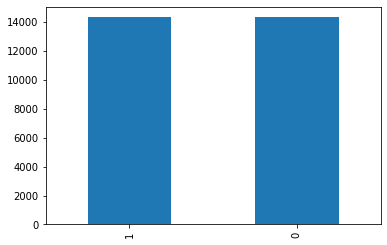

In [18]:
y.participant_name.value_counts().plot(kind="bar")

#### PATTERN DEPENDANT CLASSIFIER

In [ ]:
# get only samples for one patternI

is_pattern1 =  X['pattern_id']==0
is_pattern2 =  X['pattern_id']==1
is_pattern3 =  X['pattern_id']==2
is_pattern4 =  X['pattern_id']==3

# filter rows for year 2002 using  the boolean variable
X_pattern1 = X[is_pattern1]
X_pattern2 = X[is_pattern2]
X_pattern3 = X[is_pattern3]
X_pattern4 = X[is_pattern4]

y_pattern4 = y.iloc[X_pattern4.index.tolist()]
y_pattern3 = y.iloc[X_pattern3.index.tolist()]
y_pattern2 = y.iloc[X_pattern2.index.tolist()]
y_pattern1 = y.iloc[X_pattern1.index.tolist()]

In [ ]:
selected_pattern_x = X_pattern4
selected_pattern_x

In [ ]:
selected_pattern_y = y_pattern4
selected_pattern_y

In [ ]:
# X = selected_pattern_x
# X

In [ ]:
# y = selected_pattern_y
# y

#### FEATURE COLUMNS

In [19]:
FEATURE_COLUMNS = X.columns.tolist()[1:]  # always starting from 1
FEATURE_COLUMNS

['trace_difference',
 'pupil_diameter',
 'x_coord',
 'y_coord',
 'series_original_lenght',
 'pattern_id']

In [20]:
# encode labels: participant_name

label_encoder = LabelEncoder()

encoded_labels = label_encoder.fit_transform(y.participant_name)
print({k:v for k, v in zip(label_encoder.classes_.tolist(), set(encoded_labels))})

{0: 0, 1: 1}


In [21]:
y["label"] = encoded_labels
y.reset_index(inplace=True)
del y["index"]
y

,series_id,participant_name,label
0,0,1,1
1,0,1,1
2,0,1,1
3,0,1,1
4,0,1,1
...,...,...,...
28653,177,0,0
28654,177,0,0
28655,177,0,0
28656,177,0,0


#### TRAIN-TEST-VAL SPLIT

In [22]:
# train, val, test split stratifies (balanced)

targets = []
data = []
for series_id, group in X.groupby("series_id"):
  sequence_features = group[FEATURE_COLUMNS]
  label = y[y.series_id == series_id].iloc[0].label  # all series would have same label so just take one
  data.append(sequence_features)
  targets.append(label)

train_sequences, test_sequences, ytrain, ytest= train_test_split(data, targets, test_size=0.2, random_state = 42, stratify=targets)
train_sequences, val_sequences, ytrain, yval = train_test_split(train_sequences, ytrain, test_size=0.2, random_state = 42, stratify=ytrain)

train_sequences = [(sequence, label) for sequence, label in zip(train_sequences, ytrain)]
test_sequences = [(sequence, label) for sequence, label in zip(test_sequences, ytest)]
val_sequences = [(sequence, label) for sequence, label in zip(val_sequences, yval)]

print("train, val, test")
len(train_sequences), len(val_sequences), len(test_sequences)

train, val, test


(113, 29, 36)

In [29]:
class UserDataset(Dataset):

  def __init__(self, sequences) -> None:
    super().__init__()
    self.sequences = sequences

  def __len__(self):
    return len(self.sequences)

  def __getitem__(self, idx):
    sequence, label = self.sequences[idx]
    return dict(
        sequence=torch.Tensor(sequence.to_numpy()),
        labels=torch.tensor(label).long()
    )
  def pad_sequences(self):
    pass

In [28]:
print("cpu_count: ", cpu_count())

# for reproducibility
def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

g = torch.Generator()
g.manual_seed(42)

class UserDataModule(pl.LightningDataModule):

  def __init__(self, train_sequences, test_sequences, val_sequences, batch_size):
    super().__init__()
    self.train_sequences = train_sequences
    self.test_sequences = test_sequences
    self.val_sequences = val_sequences
    self.batch_size = batch_size

  def setup(self, stage=None):
    self.train_dataset = UserDataset(self.train_sequences)
    self.test_dataset = UserDataset(self.test_sequences)
    self.val_dataset = UserDataset(self.val_sequences)

  def train_dataloader(self):
    return DataLoader(
        self.train_dataset,
        batch_size = self.batch_size,
        shuffle=True,
        num_workers=cpu_count(),
        worker_init_fn=seed_worker,
        generator=g,
    )

  def val_dataloader(self):
    return DataLoader(
        self.val_dataset,
        batch_size = self.batch_size,
        shuffle=False,
        num_workers=cpu_count(),
        worker_init_fn=seed_worker,
        generator=g,
    )

  def test_dataloader(self):
    return DataLoader(
        self.test_dataset,
        batch_size = self.batch_size,
        shuffle=False,
        num_workers=cpu_count(),
        worker_init_fn=seed_worker,
        generator=g,
    ) 

cpu_count:  2


#### GOOGLE COLAB DEPENDECIES (for training)

In [ ]:
# (just run once)
!wget -O mini.sh https://repo.anaconda.com/miniconda/Miniconda3-py39_4.9.2-Linux-x86_64.sh
!chmod +x mini.sh
!bash ./mini.sh -b -f -p /usr/local
!conda install -q -y jupyter
!conda install -q -y google-colab -c conda-forge
!python -m ipykernel install --name "py39" --user

#### MODEL BUILD

In [30]:
N_EPOCHS = 1800
BATCH_SIZE = 15

data_module = UserDataModule(train_sequences, test_sequences, val_sequences, BATCH_SIZE)

In [31]:
# model

def init_weights(m, verbose=False):
      if "LSTM" in str(m):
        parameters = m._parameters.copy()
        for param, v in m._parameters.items():
          try:
            if "weight" in param:
              parameters[param] = torch.nn.init.xavier_uniform_(v)
            elif "bias" in param:
              parameters[param] = v.fill_(0.01)
          except RuntimeError:
            if verbose:
              print(f"lstm_parameter {param} uses grad and cannot be initialized")
        print("LSTM module weights and biases initialized")
        return parameters
      torch.nn.init.xavier_uniform_(m.weight)
      m.bias.data.fill_(0.01)
      print("Linear module weights and biases initialized")

class SequenceModel(nn.Module):

  def __init__(self, n_features, n_classes, n_hidden=256, n_layers=2):
    super().__init__()
    self.lstm = nn.LSTM(
        input_size=n_features,
        hidden_size = n_hidden,
        num_layers=n_layers,
        batch_first = True,
        dropout=0.75   # hyperparameter for regularization
    )
    self.classifier = nn.Linear(n_hidden, n_classes)

    self.lstm.apply(init_weights)
    self.classifier.apply(init_weights)

  def forward(self, x):
    self.lstm.flatten_parameters()  # for multi_gpu purposes
    _, (hidden, _) = self.lstm(x)
    out = hidden[-1]
    return self.classifier(out)

In [32]:
class UserPredictor(pl.LightningModule):

  def __init__(self, n_features:int, n_classes:int):
    super().__init__()
    self.model = SequenceModel(n_features, n_classes)
    self.criterion = nn.CrossEntropyLoss()

  def forward(self, x, labels=None):
    output = self.model(x)
    loss = 0
    if labels is not None:
      loss = self.criterion(output, labels)
    return loss, output

  def configure_optimizers(self):
    return optim.Adam(self.parameters(), lr=0.0001)

  def training_step(self, batch, batch_idx):
    sequences = batch["sequence"]
    labels = batch["labels"]
    loss, outputs = self(sequences, labels)
    predictions = torch.argmax(outputs, dim=1)
    step_accuracy = accuracy(predictions, labels)

    self.log("train_loss", loss, prog_bar=True, logger=True)
    self.log("train_accuracy", step_accuracy, prog_bar=True, logger=True)
    return {"loss": loss, "accuracy": step_accuracy}

  def validation_step(self, batch, batch_idx):
    sequences = batch["sequence"]
    labels = batch["labels"]
    loss, outputs = self(sequences, labels)
    predictions = torch.argmax(outputs, dim=1)
    step_accuracy = accuracy(predictions, labels)
    
    self.log("val_loss", loss, prog_bar=True, logger=True)
    self.log("val_accuracy", step_accuracy, prog_bar=True, logger=True)
    return {"loss": loss, "accuracy": step_accuracy}

  def test_step(self, batch, batch_idx):
    sequences = batch["sequence"]
    labels = batch["labels"]
    loss, outputs = self(sequences, labels)
    predictions = torch.argmax(outputs, dim=1)
    step_accuracy = accuracy(predictions, labels)

    self.log("test_loss", loss, prog_bar=True, logger=True)
    self.log("test_accuracy", step_accuracy, prog_bar=True, logger=True)
    return {"loss": loss, "accuracy": step_accuracy}

In [33]:
model = UserPredictor(
    n_features=len(FEATURE_COLUMNS),
    n_classes=len(label_encoder.classes_)
)

LSTM module weights and biases initialized
Linear module weights and biases initialized


In [ ]:
# init tensorboar

# %load_ext tensorboard
# %tensorboard --logdir ./logs

In [60]:
# usually earlystopping is added to stop before the model overfits too much (val acc and val loss). BUT here I am also saving the best model so far (for val acc max), so I can stop it once it
# cannot learn anymore from the training set (train acc max) instead

checkpoint_callback = ModelCheckpoint(
    dirpath= "checkpoints",
    filename= "best-checkpoint",
    save_top_k=1,
    verbose= False,
    monitor="val_accuracy",
    mode="max"
)

# if the train loss does not improve for 400 epochs then stop
early_stop_callback = EarlyStopping(monitor='val_accuracy', patience=600, verbose=True, mode="max")  # try monitoring the val loss instead

logger = TensorBoardLogger("logs", name="usergaze")

trainer = pl.Trainer(
    logger = logger,
    callbacks=[checkpoint_callback, early_stop_callback],
    max_epochs=N_EPOCHS,
    accelerator="gpu",  # gpu
    devices=1,
    enable_progress_bar=True,
    log_every_n_steps=2  # 1, 2; 10, 50 are bigger than batch: how often you want to log the metrics
)

# stop when hitting a time limit depending on resourses

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


#### TRAIN

In [ ]:
environ['WANDB_CONSOLE'] = 'off'
trainer.fit(model, data_module)  # run twice when error

# val_accuracy makes increments of 3.4% every time...

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type             | Params
-----------------------------------------------
0 | model     | SequenceModel    | 797 K 
1 | criterion | CrossEntropyLoss | 0     
-----------------------------------------------
797 K     Trainable params
0         Non-trainable params
797 K     Total params
3.189     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_accuracy improved. New best score: 0.828


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_accuracy improved by 0.034 >= min_delta = 0.0. New best score: 0.862


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_accuracy improved by 0.034 >= min_delta = 0.0. New best score: 0.897


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_accuracy improved by 0.034 >= min_delta = 0.0. New best score: 0.931


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_accuracy improved by 0.034 >= min_delta = 0.0. New best score: 0.966


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [ ]:
# from tensorboard import notebook
# notebook.list()

In [ ]:
# notebook.display(port=6006, height=1000)

In [50]:
!tensorboard dev upload --logdir ./logs --name Hierachical_Multivariate_TimeSeries_Classification --one_shot

# 4/1AdQt8qiEllZ4YubRed1cRNDJXTyXv13W9MPySPPPuu6URp_PMZRA9t7qCyk

TensorFlow installation not found - running with reduced feature set.

New experiment created. View your TensorBoard at: https://tensorboard.dev/experiment/asokUzW2Svi34i8kdZF6Cg/

[2022-09-07T22:16:48] Started scanning logdir.
[2022-09-07T22:16:58] Total uploaded: 22428 scalars, 0 tensors, 0 binary objects
[2022-09-07T22:16:58] Done scanning logdir.


Done. View your TensorBoard at https://tensorboard.dev/experiment/asokUzW2Svi34i8kdZF6Cg/


In [51]:
trainer.test(model, data_module)  
# data_module overall accuracy

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.8055555820465088
        test_loss             0.9815673828125
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.9815673828125, 'test_accuracy': 0.8055555820465088}]

In [53]:
trained_model = UserPredictor.load_from_checkpoint(
    './checkpoints/best-checkpoint-v2.ckpt',   # trainer.checkpoint_callback.best_model_path, ./checkpoints/best-checkpoint-v5.ckpt
    n_features=len(FEATURE_COLUMNS),
    n_classes=len(label_encoder.classes_)
)

trained_model.freeze()

LSTM module weights and biases initialized
Linear module weights and biases initialized


In [54]:
test_dataset = UserDataset(test_sequences)

predictions = []
labels = []

for item in tqdm(test_dataset):
  sequence = item["sequence"]
  label = item["labels"]

  _, output = trained_model(sequence.unsqueeze(dim=0))
  prediction = torch.argmax(output, dim=1)
  predictions.append(prediction.item())
  labels.append(label.item())

100%|██████████| 36/36 [00:00<00:00, 50.94it/s]


In [55]:
if not binary:
  print(classification_report(labels, predictions, target_names=label_encoder.classes_))
else:
  print(classification_report(labels, predictions, target_names=["0", "1"]))

              precision    recall  f1-score   support

           0       0.84      0.89      0.86        18
           1       0.88      0.83      0.86        18

    accuracy                           0.86        36
   macro avg       0.86      0.86      0.86        36
weighted avg       0.86      0.86      0.86        36



In [56]:
cm = confusion_matrix(labels, predictions)
df_cm = pd.DataFrame(
    cm, index=label_encoder.classes_, columns=label_encoder.classes_
)
df_cm

,0,1
0,16,2
1,3,15


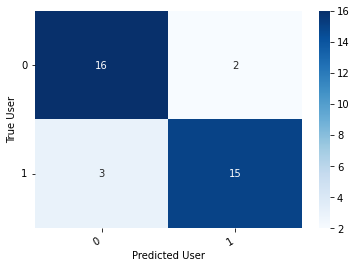

In [57]:
show_confusion_matrix(df_cm)

In [ ]:
# read model and make predictions to test data using ipywidgets
# in practice this would be trained once with a lot of participants por multilabel classification
# then you would use transfer learning to init weights of a (binary-pattern-agnostic) josephin_classifier for instance
# she would thereafter re-train the network with a few shots of pattern attempts in her device ([laptop|smartphone] with eye_tracker) and voila!
# your new security feature is ready!

# passing from binary to the same multilabel setting should not impose a problem for the execution, but what will really impose a problem is that 
# I would have an expremely unbalanced and short new dataset to re-train the nn. Can this setting work in unbalanced few-shot using transfer learning?

# (inspired by natural language inference)
# I could also translate the whole problem to a more general binary classifier; for each sample I produce two and add and extra column (["True", "False"])
# I have all the positives but to produce the negatives I can simply randomly pick a a wrong label (participant_name)
# this method would duplicate my dataset and in practice will deal better with the problems that the other setting has (balanced dataset and x2 the number of samples)
# then I would just have to be a bit smart to make the predictions and present them (translate them back to multilabel)